# Intro

This notebook provides a descriptive analysis of behavior under the exponential schedule and walks through observations that contextualize later analysis. As in the `Data Cleaning` notebook, the emphasis will be on the pushes instead of the continuous variables.

In [1]:
%matplotlib inline
import logging
import os

import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np

from foraging import SEED, MULTIPLOT_FIGSIZE, BIN_WIDTH, WINDOW_SIZE, STEP
from foraging.plotting import bp, embeddable_to_conds, enhanced_violinplot, gifler
from foraging.plotting.behavior import BehaviorPlotter

from foraging.config.experiments import AngelakiPlottingConfig
from foraging.utils.autoreload import setup_auto_reload
from foraging.utils.data import display_df, filter_df, make_angelaki_experiment, angelaki_exclusion_criteria
from foraging.models.experiment import Experiment

# Supress annoying warnings and filter out logs that aren't useful here
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# Set up development tools
setup_auto_reload()
pd.options.mode.copy_on_write = True

# Important filepaths and constants
EXPERIMENT_DIR = "../../data/experiments/angelaki"
ANALYSIS_DIR = "../../data/analysis"
FIGURES_DIR = "../../figures"
RNG = np.random.default_rng(SEED)
TO_HTML = False  # Change this to True when rendering HTML
ZOOM_KWARGS = {  # Convenience settings for zoomed in plots
    "show_traces": True,
    "smooth_kwargs": {"win_type": "gaussian", "window_size": 30, "step": 5},
}
FULL_BLOCK_KWARGS = {
    "min_obs": 10,
    "smooth_kwargs": {"win_type": "gaussian"},
}

✅ Auto-reload extension loaded!
✅ Auto-reload w/ 2 mode enabled! Changes to all packages will be automatically loaded.


# Table of Contents
- [Load Data](#Load-Data)
  - [Data Overview](#Data-Overview)
- [Explore Data](#Explore-Data)
  - [Example Block](#Example-Block)
  - [Pushes](#Pushes)
    - [Runlengths](#Runlengths)
    - [Accuracy](#Accuracy)
    - [Surprise](#Surprise)
    - [Staying vs Switching](#Staying-vs-Switching)
  - [Block Dynamics](#Block-Dynamics)
    - [Push Rate](#Push-Rate)
    - [Push Intervals](#Push-Intervals)
    - [Reward Rate](#Reward-Rate)
    - [Reward-Per-Push](#Reward-Per-Push)
  - [Matching Law](#Matching-Law)
- [Conclusion](#Conclusion)

# Load Data

The experiment data consists of multiple matfiles corresponding to the data for different subjects. Each matfile contains that subject's push, eye tracking (if available), and position (if available) data organized by blocks and sessions. Each block corresponds to a set of experiment parameters, notably the schedule of each box, the stimulus reliability kappa, and the stimulus type. A hierarchical overview of a given matfile is given in the `Data Cleaning` notebook.

Here is a DataFrame showing a subset of the data, after applying the exclusion criteria detailed in `Data Cleaning`. Refer to the docstring of `make_df` and `exclusion_criteria` for more information about the contents of the DataFrame.

In [12]:
%%capture --no-display
%%capture --no-display
dataset = make_angelaki_experiment(EXPERIMENT_DIR, bin_pushes=None)
dataset = dataset.filter({"shape": 1})
dataset = angelaki_exclusion_criteria(dataset, EXPERIMENT_DIR)
plotter = BehaviorPlotter(dataset, AngelakiPlottingConfig().to_dict())
df = dataset.df

# Remove some unnecessary blocks
df = df.drop(
    df[(df["schedule"] == 30) | (df["schedule"] == 7)].groupby(dataset.block_identifiers).size().index
)
df = df.drop(df[(df["schedule"] == 15) & (df["box"] == "medium")].index)

# Finally, chop off time from blocks that don't have much data
df = df[df["push times"] < 1200]
plotter.dataset = dataset = dataset.wrap(df)
display_df(df, ["subject", "session", "block", "box", "push times", "reward outcomes"])

| subject | session | block | box | push times | reward outcomes |
| --- | --- | --- | --- | --- | --- |
| dylan | 20211206 | 2 | slow | 3.1349999997764826 | False |
| dylan | 20211206 | 2 | fast | 8.464999999850988 | False |
| dylan | 20211206 | 2 | fast | 9.467999999877065 | False |
| dylan | 20211206 | 2 | fast | 11.666999999899417 | False |
| dylan | 20211206 | 2 | medium | 17.125 | False |

## Data Overview
A quick overview of the summary statistics:

In [10]:
print("schedules experienced by each subject")
print(df.groupby("subject")["schedule"].unique())

schedules experienced by each subject
subject
dylan     [35.0, 15.0, 21.0]
marco     [35.0, 15.0, 21.0]
viktor    [15.0, 21.0, 35.0]
Name: schedule, dtype: object


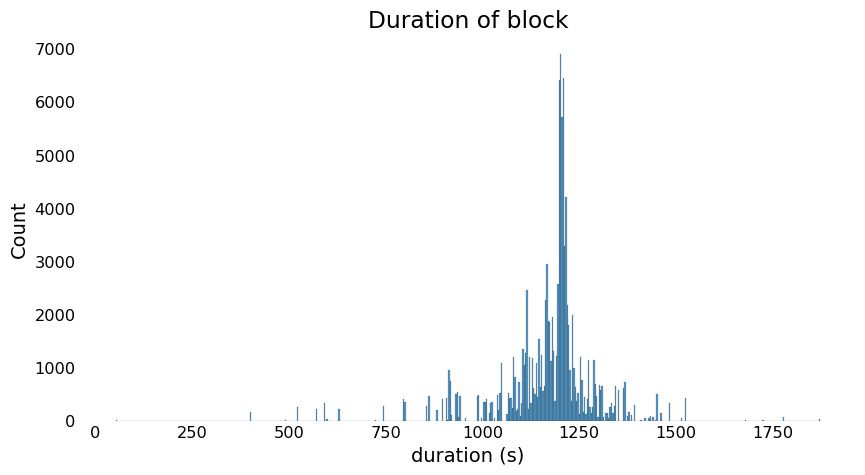

In [11]:
sns.histplot(df, x="duration")
plt.title("Duration of block")
plt.xlabel("duration (s)");

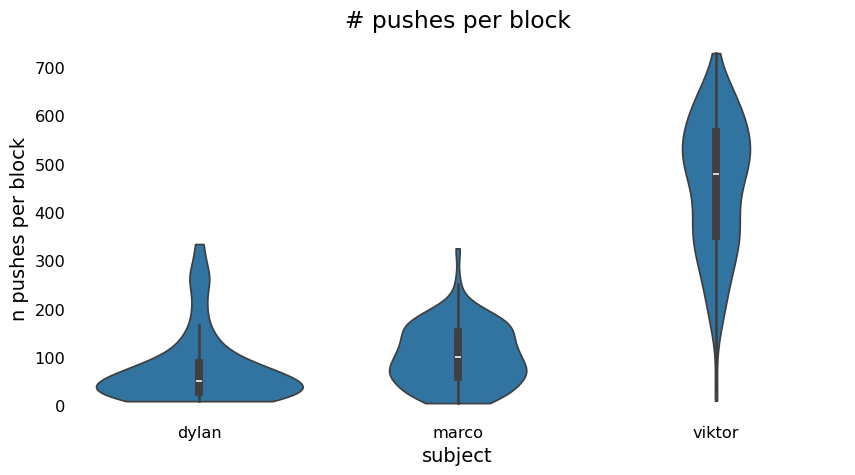

In [12]:
block_summary = (
    df.groupby(["subject", "session", "block"])
    .size()
    .reset_index(name="n pushes per block")
)
sns.violinplot(block_summary, x="subject", y="n pushes per block", cut=0)
plt.title("# pushes per block");

# Explore Data
The behavioral quantities we will explore are: push intervals, consecutive push intervals, stay pushes, switch pushes, runlengths of consecutive choices, etc. These are defined as follows:
+ <span style='color:#03a9fc'>push intervals</span>: time between pushes *at the same box*, which can include pushes made at other boxes during this interval. This is essentially how long the subject has been waiting on this box to be ready before they push at that box again. Depending on context, this is interchangeable with push times (for example, if discussing push times in a block, then this should be interpreted as the absolute time the push occurred in the block, not the time between pushes. On the other hand, push times for an individual choice the subject made should be interpreted as the push interval). Unless otherwise noted, this is the default meaning for push intervals.
+ <span style='color:#fa5cbe'>consecutive push intervals</span>: time between *consecutive* pushes-- unlike general push intervals, this can include the time between pushes at different boxes.
+ <span style='color:#fa0c9f'>stay times/stay pushes</span>: the intersection of consecutive push intervals and general push intervals, which occurs when the subject chooses to stay at their current box and push again.
+ <span style='color:#22c793'>switch times/switch pushes</span>: the time between consecutive pushes at different boxes, which may potentially largely capture travel time between equidistant boxes.
+ <span style='color:#ff9d00'>runlengths</span>: the number of times the subject pushes the same box before switching boxes.

One hypothesis we would like to test is whether the subjects' push intervals obey the matching law, which is a normative principle that states that how often an option is picked is proportional to the reward they give. For example, a box with a faster schedule should be visited more frequently than a slower box. A good discussion of when matching is the result of theoretically optimal decision-making can be found in [(Sakai & Fukai 2008)](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0003795). In our study, the matching law should materialize as the reward rates being proportional to the visit frequencies of each box; since each box has a different schedule, then, in expectation, the push times for a given box should be proportional to the schedules of that box.

## Example Block

Here we show activity in an example block unfolding over time. Blue = fast box, yellow = medium box, red = slow box. Filled markers indicate rewarded pushes, unfilled unrewarded.

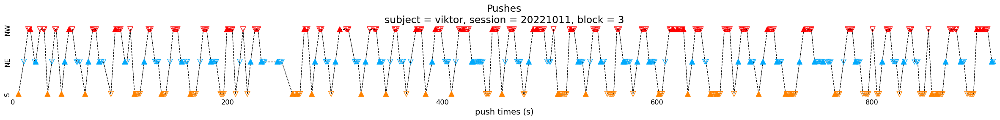

In [13]:
plotter.plot_pushes(conds = dict(subject="viktor", session=20221011, block=3), fig_kwargs=dict(figsize=(30, 2.2)), legend=False);

Notice the sequences of pushes happening very close together in time. This is a salient feature of the behavior under the exponential schedule.

## Pushes

Here is an overview of the statistics of the pushes for each subject. Black dots connected by a line denote the mean push interval.

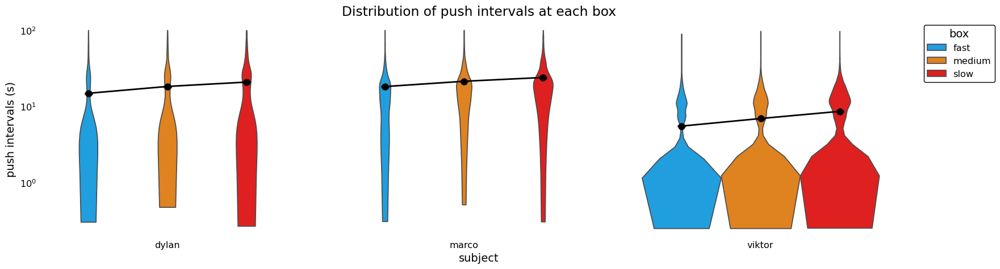

In [30]:
fig, ax = plt.subplots(figsize=MULTIPLOT_FIGSIZE)
df2 = df[df["push intervals"] < 100]
# bp(sns.swarmplot)(
#     df2.groupby("subject").sample(10000, random_state=SEED, replace=True),
#     x="subject",
#     y="push intervals",
#     hue="box",
#     palette=plotter.get_config_value("palette_dark"),
#     legend=False,
#     log_scale=True,
#     size=0.35,
#     dodge=True,
#     ax=ax,
# )

bp(enhanced_violinplot)(
    df2,
    x="subject",
    y="push intervals",
    hue="box",
    palette=plotter.get_config_value("palette"),
    title="Distribution of push intervals at each box",
    y_unit="s",
    cut=0,
    inner=None,
    # log_scale=True,
    common_norm=False,
    bw_adjust=1,
    ax=ax,
);
ax.set_yscale('log')

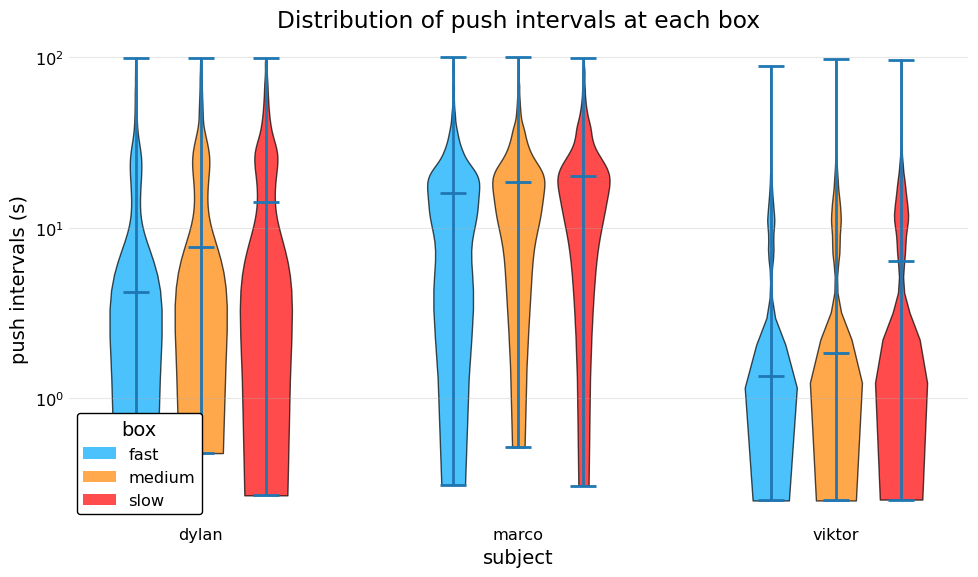

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data grouped by subject and box
# df2 = df2.reset_index()
subjects = df2["subject"].unique()
boxes = sorted(df2["box"].unique())
palette = plotter.get_config_value("palette")

# Create figure if ax not provided
fig, ax = plt.subplots(figsize=(10, 6))

# Prepare data and positions
data_to_plot = []
positions = []
colors = []
pos = 0
width = 0.8
spacing = 1.5

for subject in subjects:
    for i, box in enumerate(boxes):
        # Get data for this subject-box combination
        mask = (df2["subject"] == subject) & (df2["box"] == box)
        box_data = df2.loc[mask, "push intervals"].dropna()
        
        if len(box_data) > 0:
            data_to_plot.append(box_data.values)
            positions.append(pos)
            colors.append(palette[box])
            pos += width
    
    pos += spacing  # Add space between subjects

# Create violin plot
parts = ax.violinplot(data_to_plot, 
                       positions=positions, 
                       widths=width * 0.8,
                       showmeans=False, 
                       showextrema=True,
                       showmedians=True,
                       )  # Multiply default bandwidth by 2 (equivalent to bw_adjust=2)

# Color the violins according to box
for pc, color in zip(parts['bodies'], colors):
    pc.set_facecolor(color)
    pc.set_alpha(0.7)
    pc.set_edgecolor('black')
    pc.set_linewidth(1)

# Set log scale
ax.set_yscale('log')

# Set x-axis labels (subject names)
subject_positions = []
pos = 0
for subject in subjects:
    n_boxes = len(boxes)
    # Calculate center position for this subject
    center = pos + (n_boxes * width) / 2 - width / 2
    subject_positions.append(center)
    pos += n_boxes * width + spacing

ax.set_xticks(subject_positions)
ax.set_xticklabels(subjects)

# Labels and title
ax.set_xlabel("subject")
ax.set_ylabel("push intervals (s)")
ax.set_title("Distribution of push intervals at each box")

# Add legend for boxes
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=palette[box], label=box, alpha=0.7) 
                   for box in boxes]
ax.legend(handles=legend_elements, title='box', loc='best')

# Grid
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()

Here are those same distributions, now conditioned on stimulus reliability.

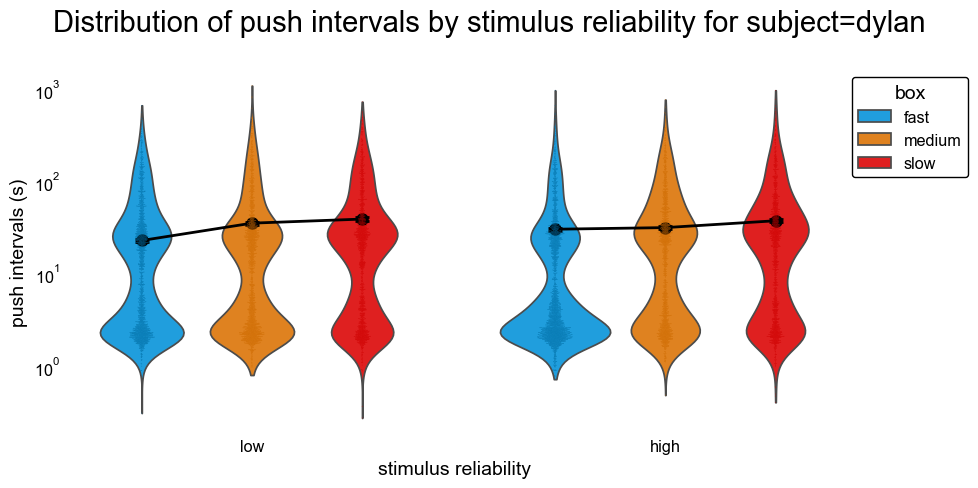

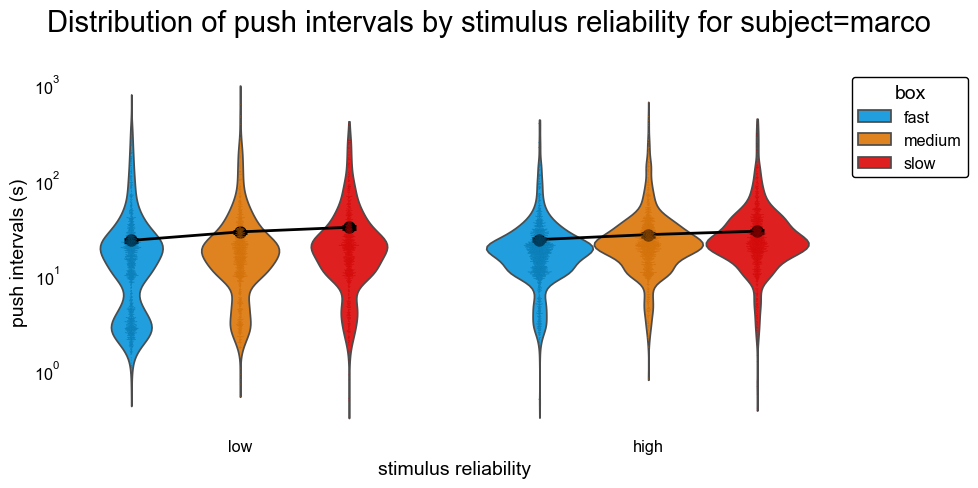

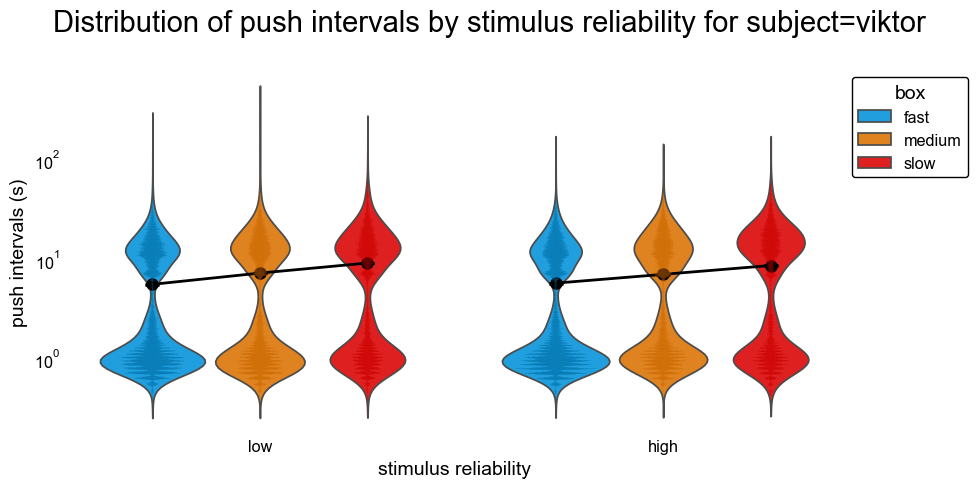

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals, fig_title = "Distribution of push intervals by stimulus reliability", cond_kwargs = {'viktor': dict(swarm_kwargs={'size': 0.25})});

There is a striking bimodality in the wait time distributions that is preserved across subjects, consisting of a fast mode around ~1 sec and a slow mode around ~10 sec. Additionally, the mean push intervals differentiate the boxes and are ordered as expected (fast > medium > slow), but they do not seem to depend on stimulus reliability.

Next, we visualize the distribution of stay and switch times.

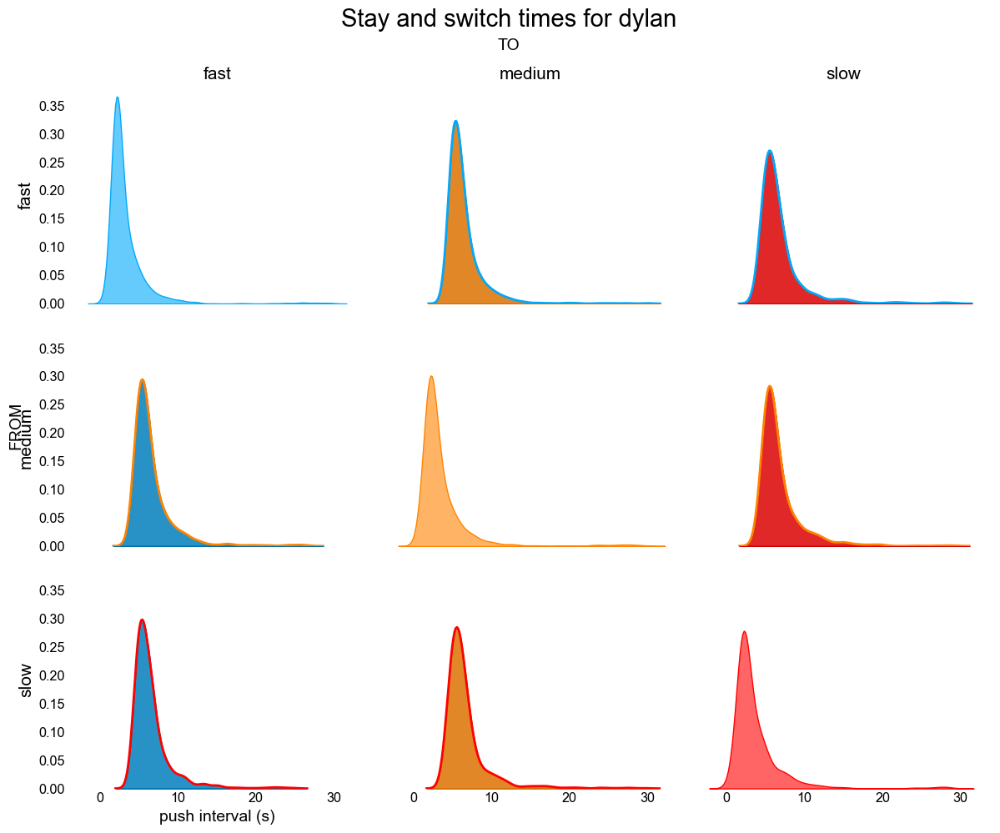

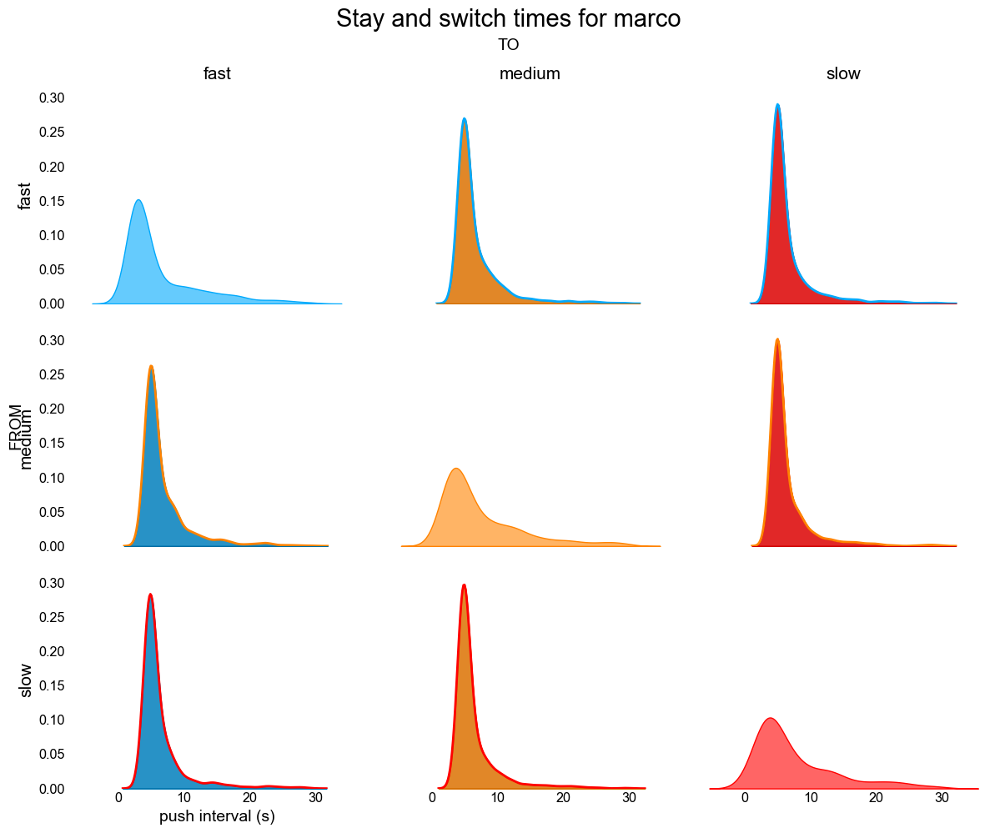

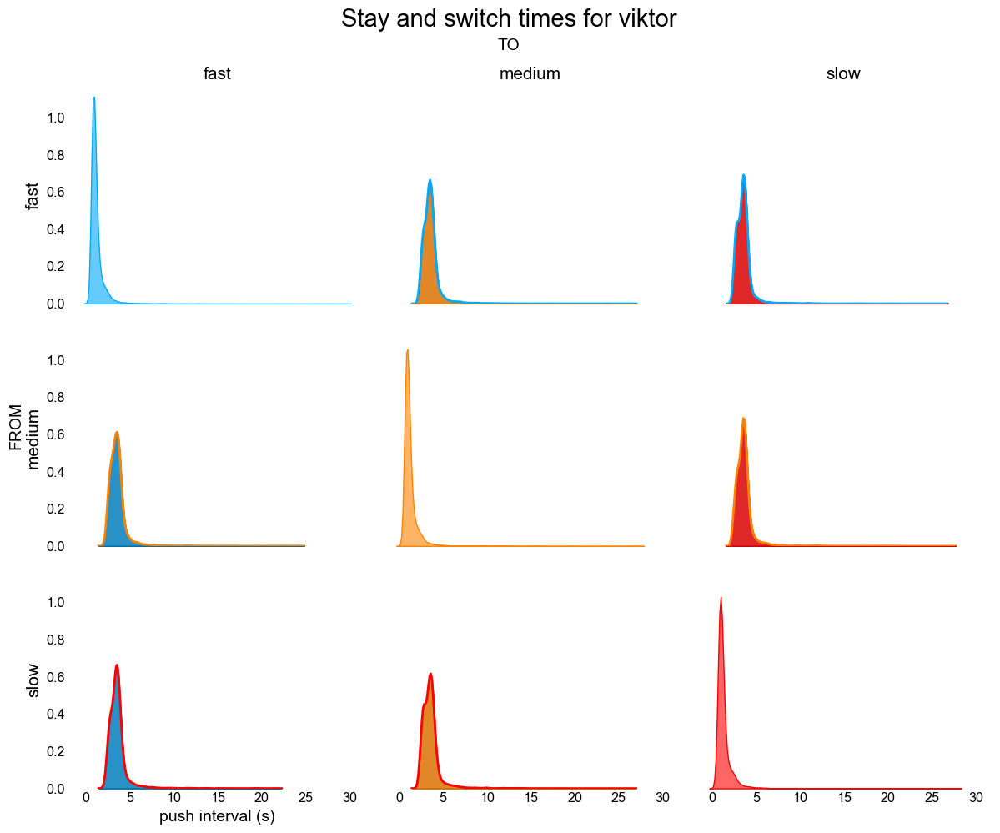

In [ ]:
plotter.plot_stay_switch_pushes();

First, for Dylan, the switch times and stay times are remarkably similar across all pairs of boxes. Generally speaking, for each subject the switch times are qualitatively similar, suggesting that most of the time spent pushing different boxes is travel time.  Second, for each subject, the stay times look qualitatively similar to each other as well.

Finally, the distribution of consecutive push intervals can reveal the complexity of the decision process-- for example, suppose the decision space is {push at $\text{box}_i$ , wait}, and each timestep the animal makes a decision whether and where to push. Then, ignoring travel cost, a simple hidden Markov model of this decision process would result in exponentially distributed intervals between pushes. Fitting an exponential distribution to each empirical distribution via maximum likelihood estimation and then performing a Kolmogorov-Smirnoff test under the null hypothesis that the data is drawn from the fitted exponential distributions resulted in rejecting the null hypothesis in each case, so the push intervals are likely the result of a much more complicated decision process.


### Runlengths
To get a sense of the statistics of *sequences* of pushes, we take a look at the runlengths.

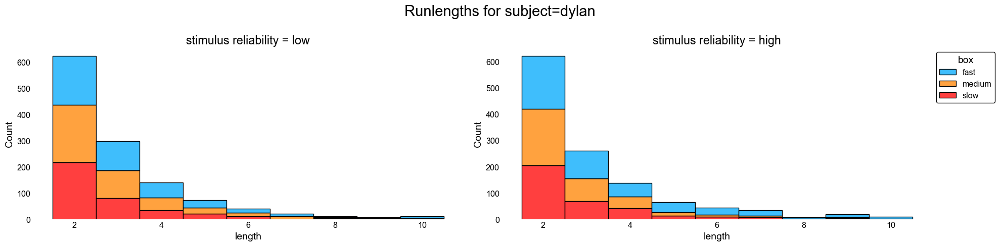

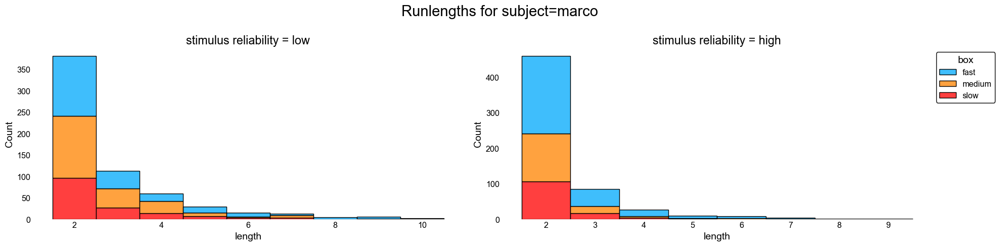

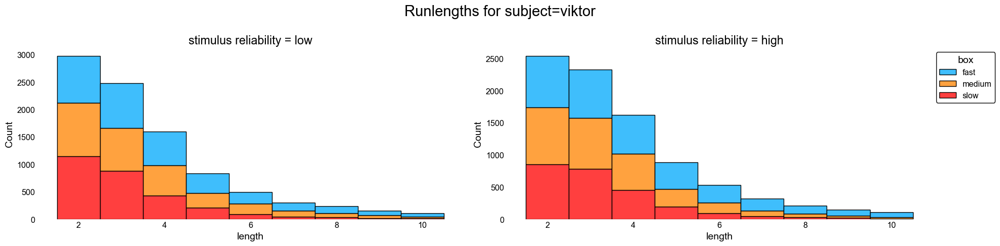

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_runlengths, col_condition = 'stimulus reliability', fig_title='Runlengths');

Marco is the only subject whose runlengths show some sensitivity to stimulus reliability, fitting in slightly more pushes at the fast box when the reliability is high.

### Accuracy

Here, we show each push interval along with the reward interval of the box that was pushed. Basically, we want to see how well the subjects timed their pushes to the reward interval of the box. Our expectation is that as the stimulus reliability increases, the subjects should be able to time their pushes more reliably to occur after the reward interval has elapsed.

[autoreload of foraging.models.distribution failed: Traceback (most recent call last):
  File "c:\Users\noush\miniconda3\envs\xaqlab2\lib\site-packages\IPython\extensions\autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\noush\miniconda3\envs\xaqlab2\lib\site-packages\IPython\extensions\autoreload.py", line 475, in superreload
    module = reload(module)
  File "c:\Users\noush\miniconda3\envs\xaqlab2\lib\importlib\__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 619, in _exec
  File "<frozen importlib._bootstrap_external>", line 883, in exec_module
  File "<frozen importlib._bootstrap>", line 241, in _call_with_frames_removed
  File "D:\Documents\Foraging\src\foraging\models\distribution.py", line 296, in <module>
    class UpdatesByBox(Protocol, BeliefUpdate[X, O]):
  File "c:\Users\noush\miniconda3\envs\xaqlab2\lib\abc.py", line 106, in __new__
    cls = super().__new__(mcl

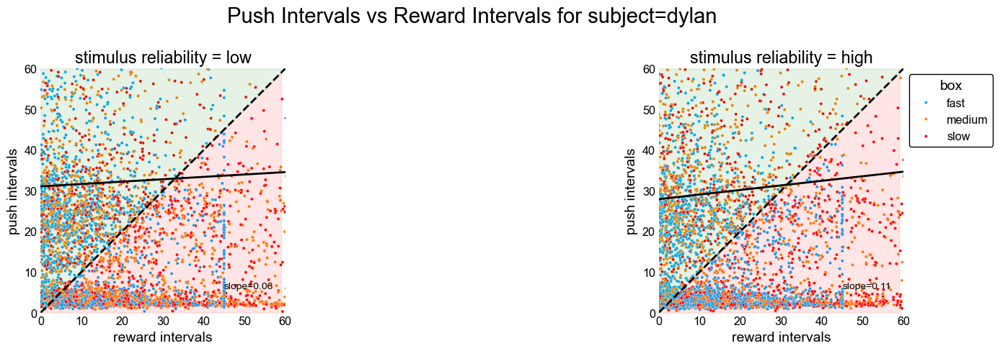

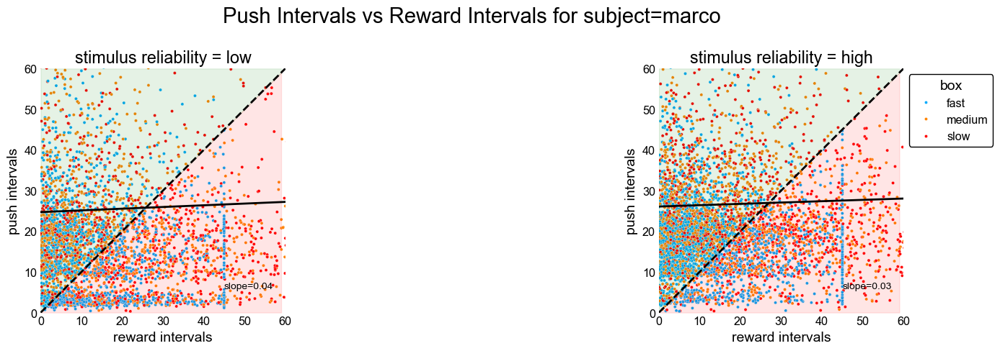

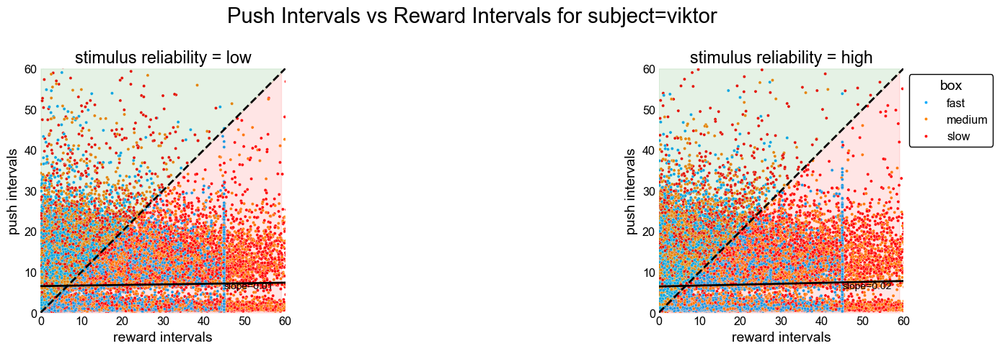

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, col_condition = 'stimulus reliability', fig_title='Push Intervals vs Reward Intervals', annotate_reg = True);

Contrary to expectations, there appears to be no correlation between the push intervals and reward intervals, not even when the reliability is high. There is an interesting cluster preserved across subjects, likely the result of spamming pushes. We separate these figures into stay vs switch pushes below.

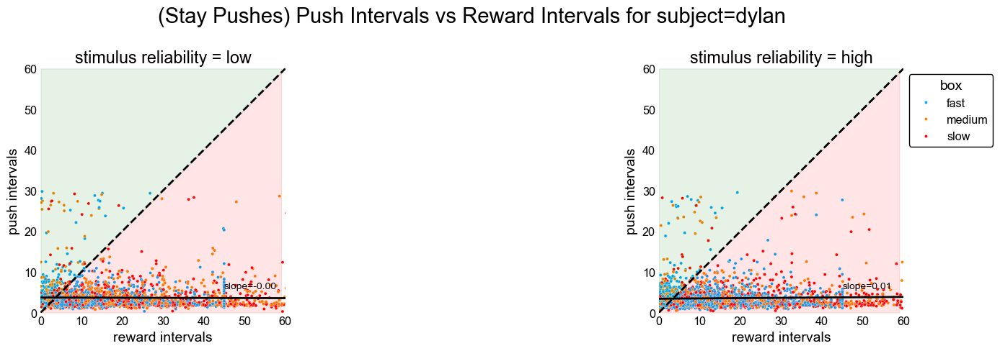

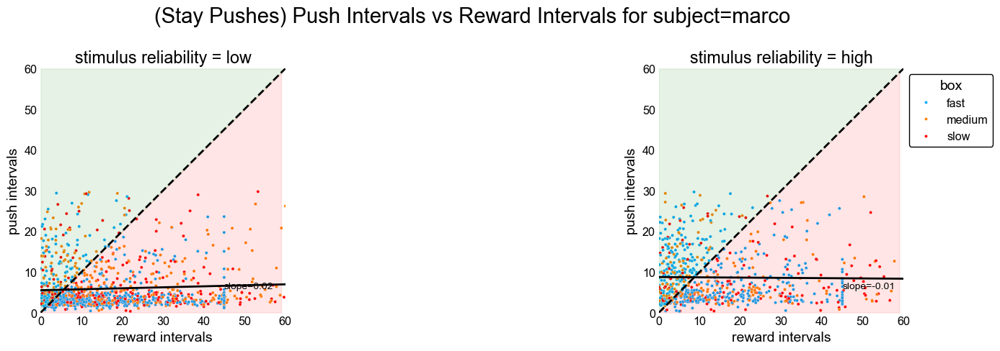

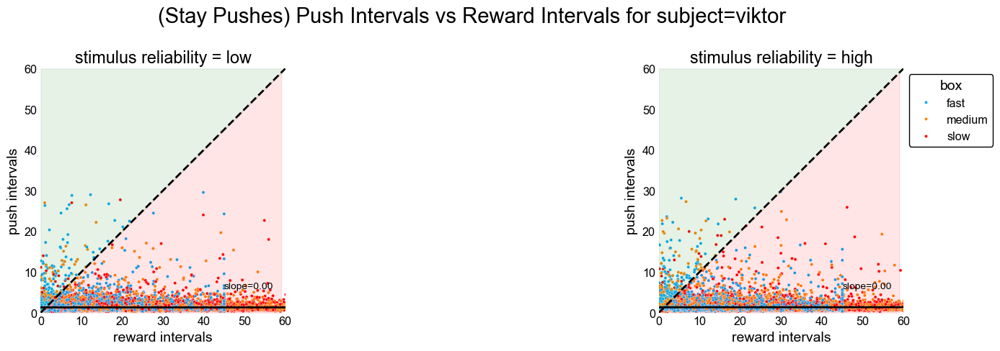

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, dataset = dataset.filter({"stay/switch": "stay"}), col_condition = 'stimulus reliability', fig_title='(Stay Pushes) Push Intervals vs Reward Intervals', annotate_reg = True);

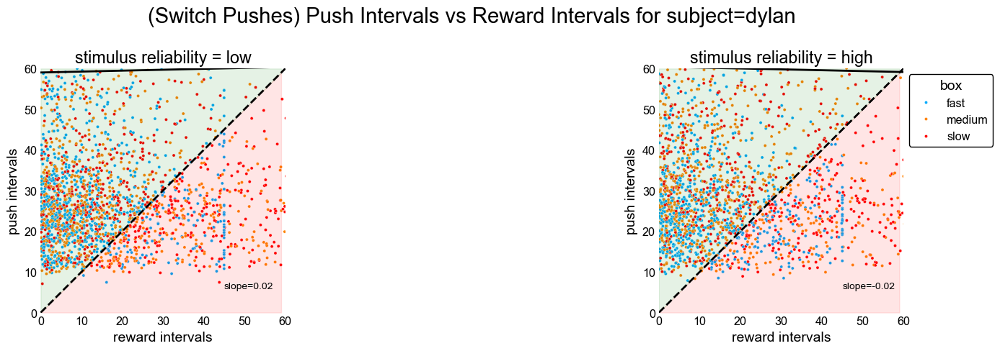

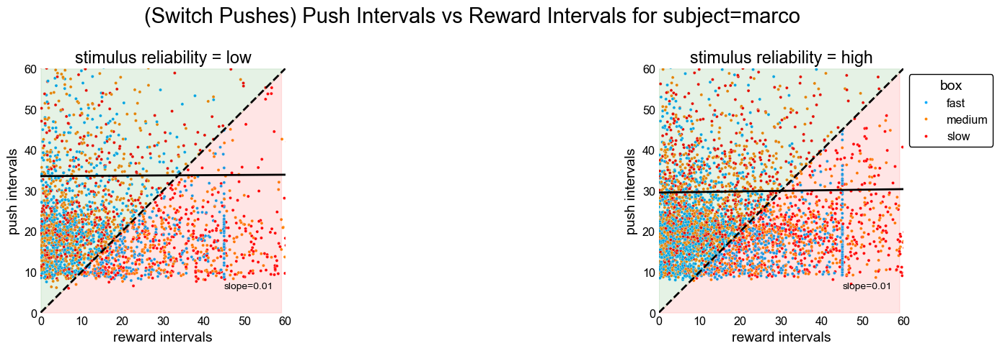

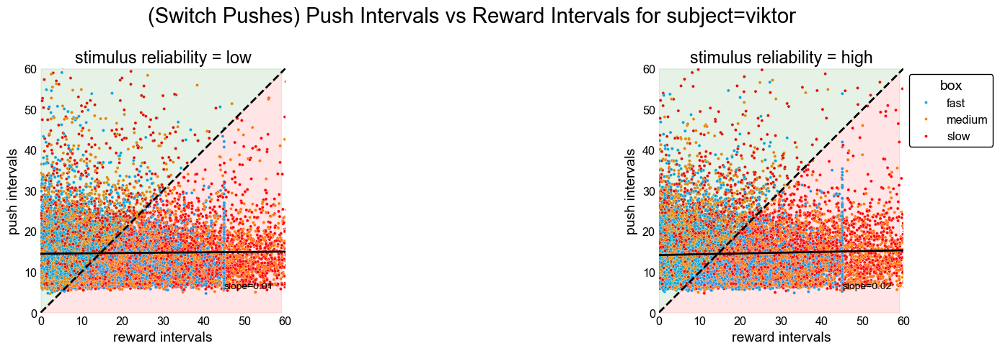

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_push_intervals_vs_reward_intervals, dataset = dataset.filter({"stay/switch": "switch"}), col_condition = 'stimulus reliability', fig_title='(Switch Pushes) Push Intervals vs Reward Intervals', annotate_reg = True);

### Surprise

We can ask how much the factor of "surprise" at a particular reward outcome influences future behavior. For example, if the subject waits a long time and still doesn't get reward, they might 1) switch boxes and 2) wait longer to push the box they left if they start to believe it's a slower box. On the other hand, the behavior of an impatient subject who tends to spam pushes serially at the same box will manifest as a string of stay pushes straddling the y = -x line because y (change in push interval) + x (current push interval) = future push interval. Due to causality (future push can't come before current push), this line also marks the lower boundary of possible points.

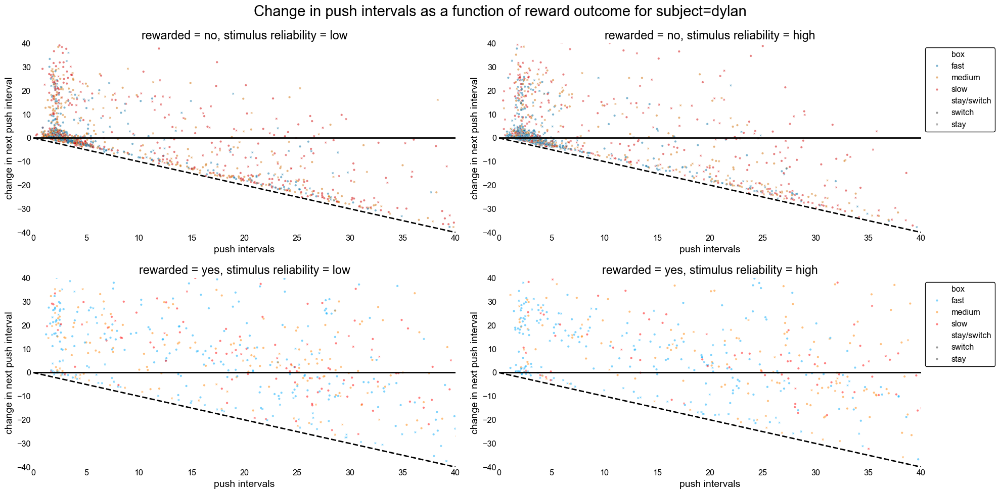

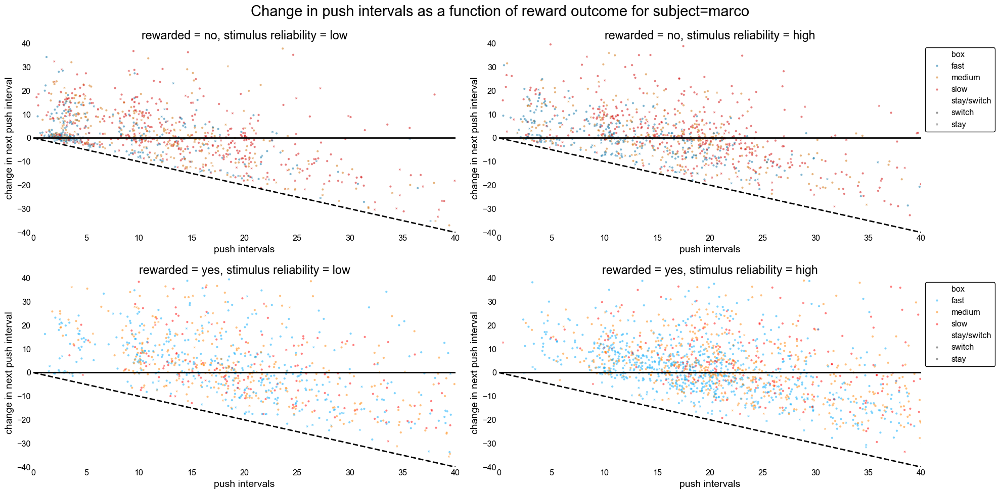

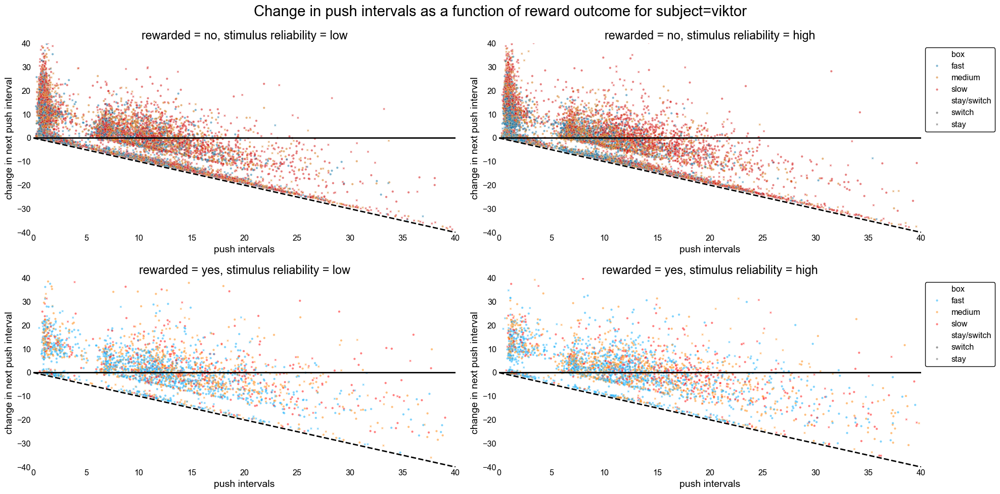

In [ ]:
df["rewarded"] = df["reward outcomes"].map({True: "yes", False: "no"})
plotter.plot_conditions_by_subject(plotter.plot_next_push_surprise, col_condition = 'stimulus reliability', aux_condition = 'rewarded', fig_title='Change in push intervals as a function of reward outcome', legend_kwargs=dict(title=None), fig_kwargs = dict(figsize=(20,10)), s=10);

Rather idiosyncratic behavior. In general, the longer a subject waits to push, the sooner they will go next time, which is just a trivial aspect of the push interval distribution (to see this, consider a gaussian distribution and condition the differences between pairs of samples on one of the samples). Let's break this down:

For Dylan, in almost all conditions, there is a string of spam pushes that are associated with *rapidly switching*, not staying. Only when the reliability is high and the push results in no reward does he opt to stay and push the same box, which is in contrast to other subjects' behavior where the string of spam pushes are almost exclusively stay pushes across all conditions. Another odd observation is that when Dylan decides to stay in all other conditions aside from (reliability = high, rewarded = no), he waits longer to push compared to the rapid switches. There are also a dense mode associated with short push intervals, where if he goes too fast and doesn't get reward, he appears to be extremely cautious and wait a long time next push. When reliability is low, he tends to stay and push again after a while, whereas when reliability is high he tends to switch before pushing.

Marco's behavior is more typical, with a small cluster of points in the (reliability = low, rewarded = no) condition indicating a series of fast pushes.

For Viktor, we see a few distinct clusters-- the string of fast stay pushes below all the points, cluster of switch pushes after fast pushes, and cloud of more reasonably paced switch pushes. These are present to various extents across all four conditions,

### Staying vs Switching

Here we calculate the probability of staying and pushing the same box again as a function of push interval aggregated across blocks. We do this separately for the rewarded and unrewarded case.

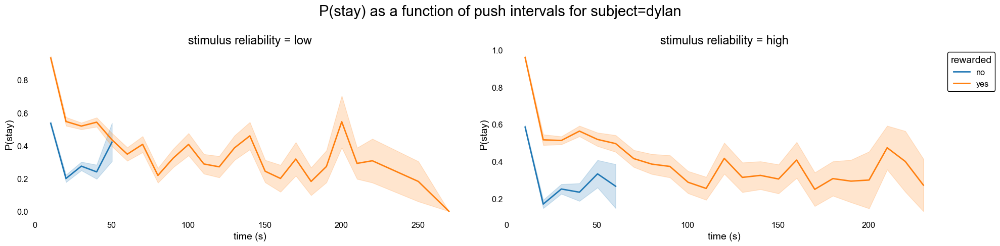

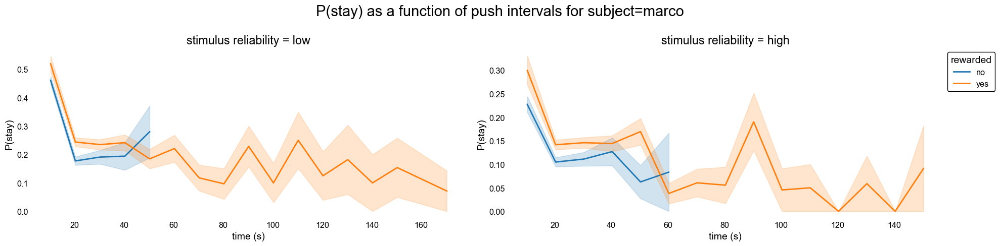

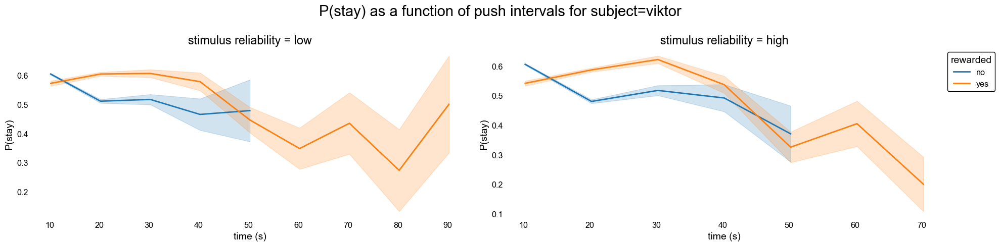

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_stay_probabilities, col_condition = 'stimulus reliability', fig_title='P(stay) as a function of push intervals', min_obs=10);

Clearly, the probability of staying is greater after receiving reward, but it generally goes down the longer the subject waits, with the exception of some weird quirks that could be due to low data volume (especially for longer push intervals).

## Block Dynamics

In this section, we explore how behavioral variables, such as reward rate and push frequency, evolve over time in the block. We will also compare to the optimal reward rate possible, if the subject were able to get each reward as soon as it became available. This is equal to the inverse mean schedules, and assuming independent boxes and negligible travel costs, the sum of their individual reward rates yields the total reward rate.

First, we'll examine the block initiation times to get a good sense of the right bin size for binning push times.

<Axes: title={'center': 'Distribution of block initiation times'}, xlabel='subject', ylabel='push times (s)'>

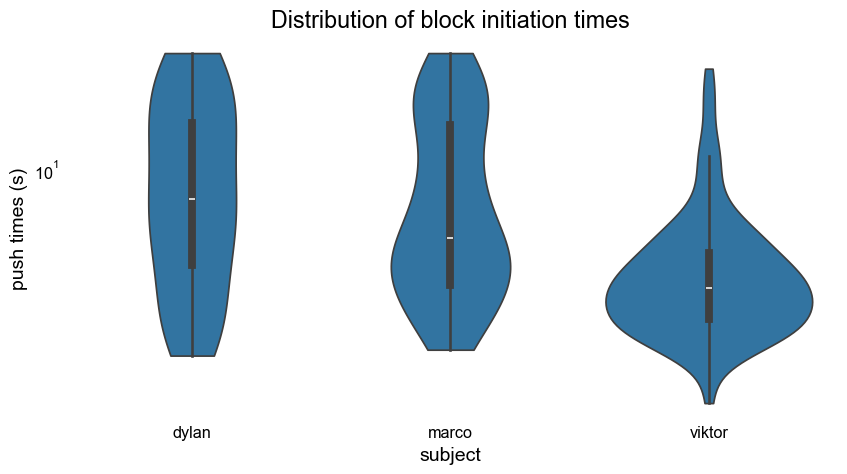

In [ ]:
df_init = df.xs(1, level="push #")
bp(sns.violinplot)(
    df_init,
    x="subject",
    y="push times",
    cut=0,
    log_scale=True,
    title="Distribution of block initiation times",
    y_unit="s",
    legend=False,
)

Looks like a bin size of 20-30 seconds should be big enough to prevent accidentally creating artifical transients in the first bin of each block. If we make the bin size too small, then we will be capturing trivial failures in the beginning of the block that aren't really reflective of anything important.

In what follows, the rates are calculated by moving either a sliding rectangular or gaussian window over the relevant quantities in each block, with a window size of 60 seconds that slides every 5 seconds. The mean of each window is then divided by the size of the window to get a rate.

### Push Rate

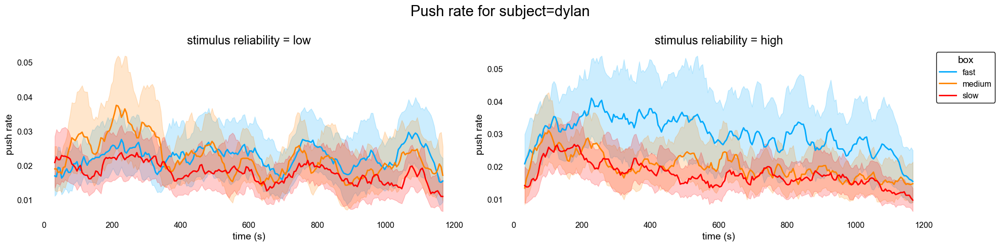

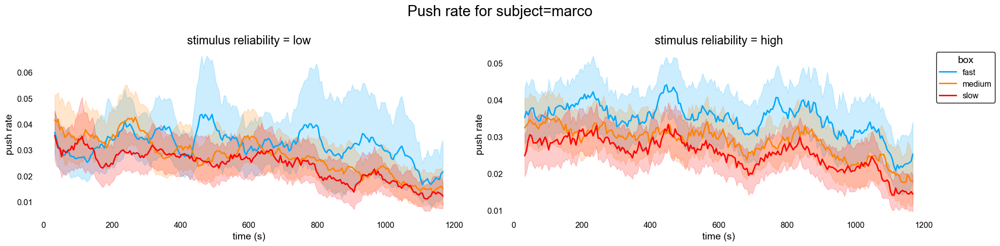

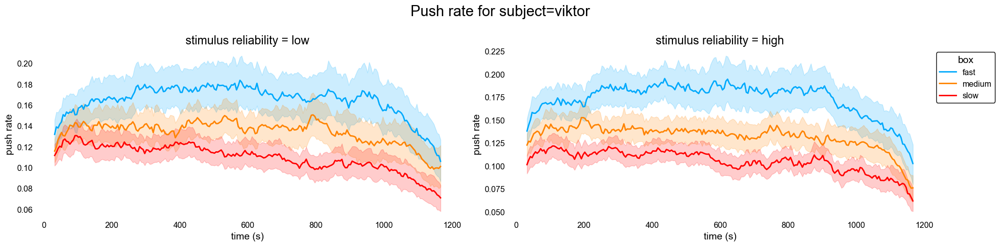

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_push_rates_across_block, col_condition = 'stimulus reliability', fig_title='Push rate', by_box = True);

The push rates for Dylan and Marco are way lower than Viktor, who seems to be pushing twice as often as the other two. In addition, he differentiate the boxes better than the others; occasionally, we see a couple blocks where the other monkeys are differentiating the boxes, but these are the exception, not the norm.

### Push Intervals

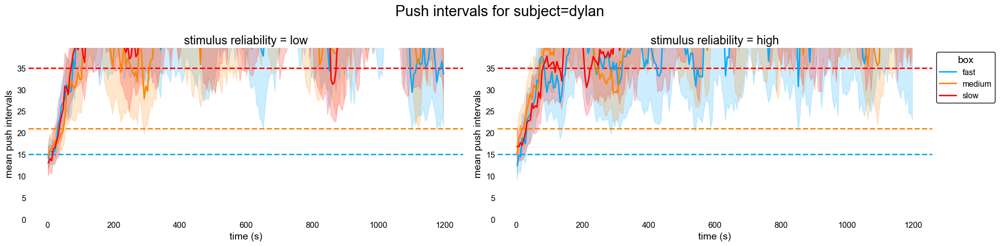

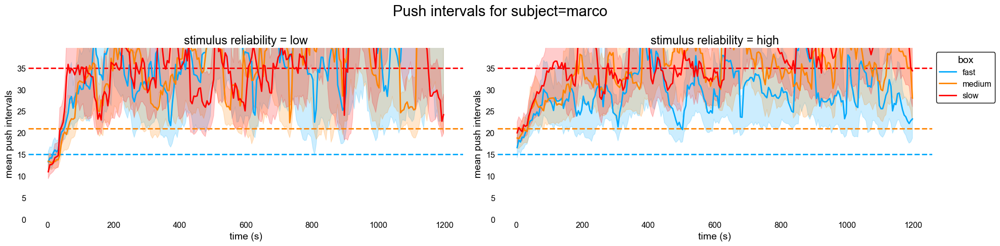

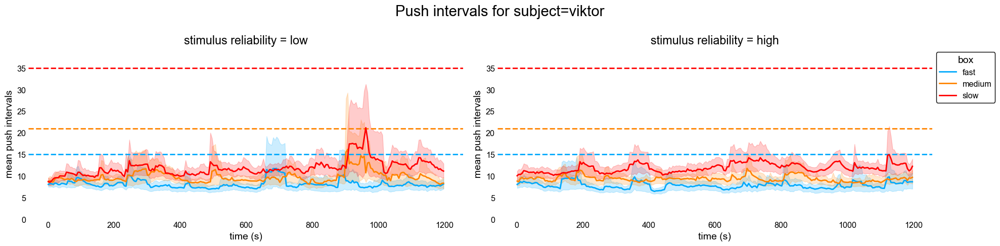

In [ ]:
def _auxiliary_plot(
    ds: Experiment,
    conds: dict = None,
    palette: dict = None,
    ax: plt.Axes = None,
    **kwargs,
):
    schedules = sorted(list(ds.get_unique("assigned schedules")[0]))
    boxes = ds.constants.BOX_LABELS
    for box, schedule in zip(boxes, schedules):
        ax.axhline(schedule, color=palette[box], linestyle="--")
    ax.set_ylim(0, 1.1*ax.get_ylim()[1])

plotter.plot_conditions_by_subject(plotter.plot_quantity_across_block, col_condition = 'stimulus reliability', x = "push times", y = "push intervals", fig_title='Push intervals', auxiliary_plot = _auxiliary_plot, min_obs = 10, by_box = True, smooth_kwargs=dict(
        fill_value=np.nan,
        min_periods=1,
    )
);

Dylan's and Marco's push intervals are within range of the schedules, but Viktor is pushing much more rapidly while distinguishing the schedules better, for an even better reward rate. This highlights one of the quirks of the exponential schedule, namely that reward rate can be somewhat maximized by a less-than-ideal strategy. We will verify in later theoretical analysis what the optimal reward rate looks like, and how the subjects compare.

### Reward Rate

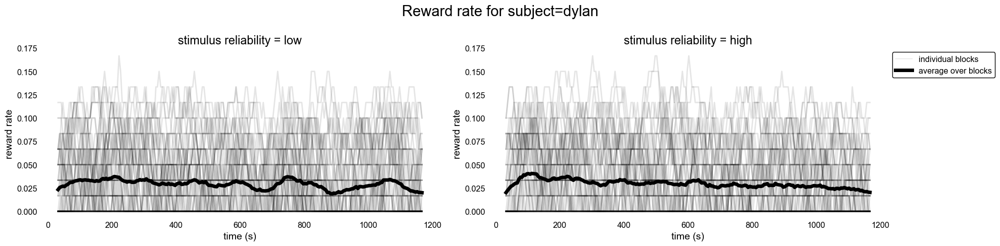

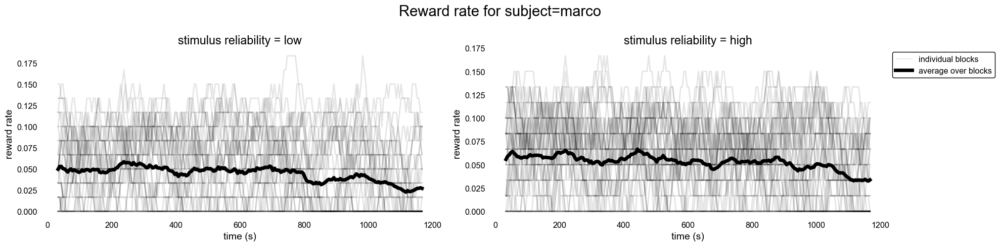

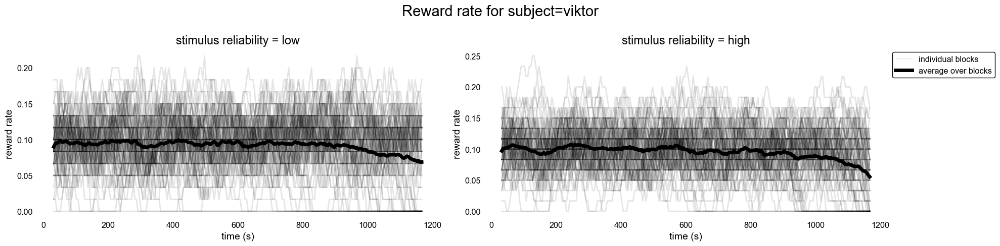

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_reward_rates_across_block, col_condition = 'stimulus reliability', fig_title='Reward rate', show_traces = True);

Viktor also achieves double the reward rate that the other subjects achieve. Note that this is still lower than what he achieves under the gamma schedule.

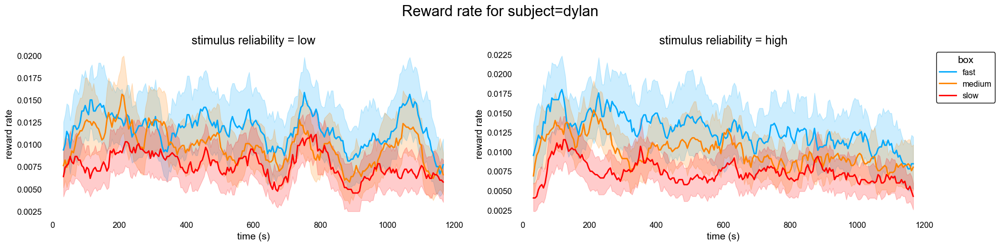

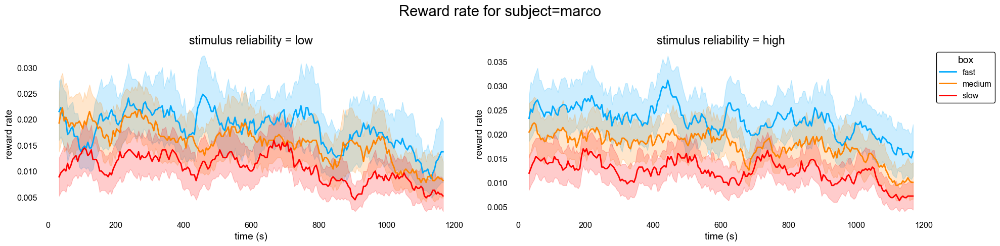

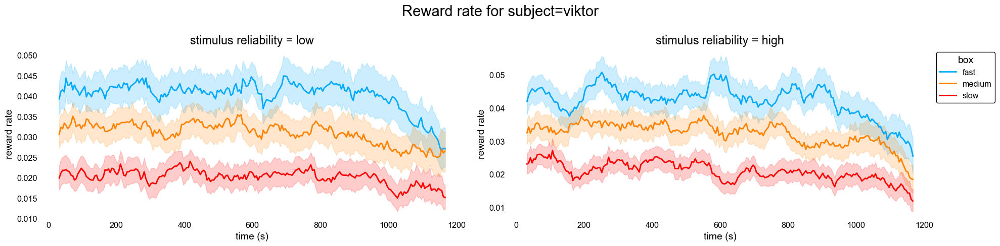

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_reward_rates_across_block, col_condition = 'stimulus reliability', fig_title='Reward rate', by_box = True);

The reward rates are somewhat ordered fast > medium > slow in Dylan and Marco's data and more strongly ordered in Viktor's.
Next, we will show the reward-per-push, which can be interpreted as the probability of getting reward. We expect Viktor to do poorly under this metric.

### Reward-Per-Push

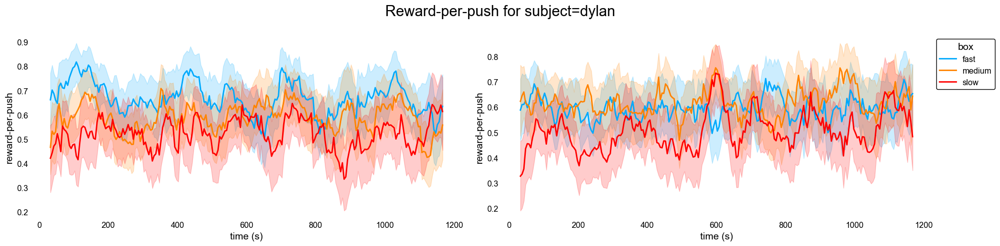

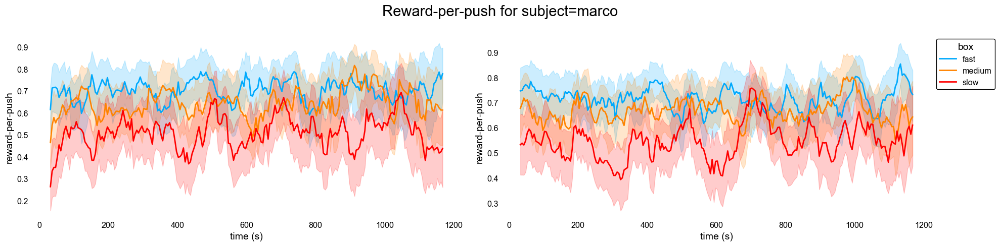

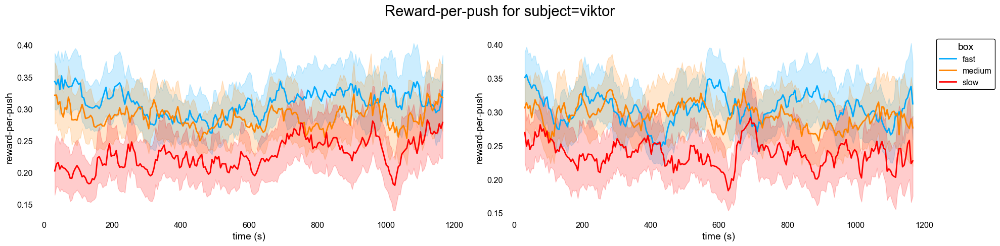

In [ ]:
plotter.plot_conditions_by_subject(plotter.plot_reward_per_push_across_block, col_condition = 'stimulus reliability', fig_title='Reward-per-push', by_box = True, min_obs = 10);

While there is a lot of variability, it is clear that on average Viktor is less accurate than the others.

## Matching Law

The matching law is a behavioral principle that states that the number of times an option is picked should be proportional to how much reward is received at that option. For example, if option A gives twice as much reward as option B, then one should pick option A twice as much as they do option B. Formally:

$$ \frac{C_i}{\sum_i C_i} \propto \frac{R_i}{\sum_i R_i}$$

where $C_i$ and $R_i$ denote the number of times option $i$ has been chosen and reward obtained from that option, respectively. The constant of proportionality captures how sensitive the subjects are to the relative reward rates-- if the subject does not perceive much difference between the options, then the constant of proportionality will be less than 1 and the subject will be said to be "undermatching". When the constant of proportionality is greater than 1, then the subject is "overmatching". In the literature, undermatching is more common than overmatching, and also subjects have been observed to have a baseline response rate, or bias that cannot be attributed to reward. This bias and sensitivity to reward rates can be captured by linearly regressing the relative response rates on the relative reward rates, which is what we do below for each block with slopes and intercepts aggregated across blocks.

GIF saved to: animation.gif



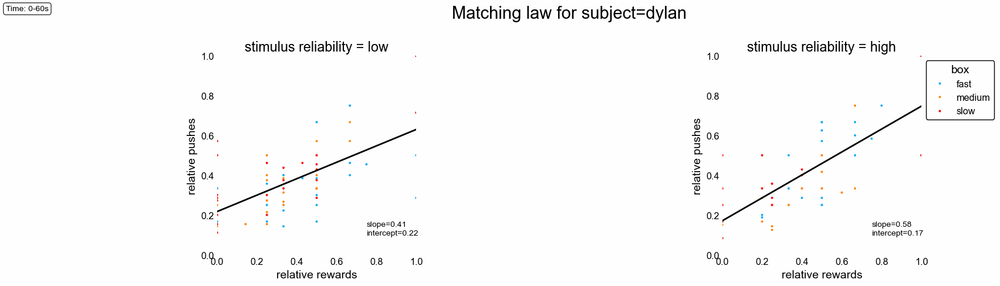

In [ ]:
time_bins = list(zip(np.arange(0, 600, 60), np.arange(0, 600, 60) + 60)) 
func = lambda time_bin: plotter.plot_conditions_by_subject(plotter.plot_matching_law, dataset = plotter.dataset.filter({"subject": "dylan"}), col_condition = 'stimulus reliability', fig_title = "Matching law", time_bin = time_bin);
gifler(time_bins, func);

GIF saved to: animation.gif



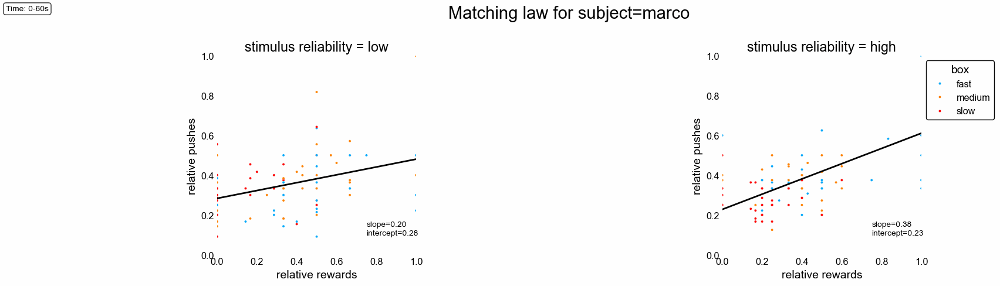

In [ ]:
time_bins = list(zip(np.arange(0, 300, 60), np.arange(0, 300, 60) + 60))
func = lambda time_bin: plotter.plot_conditions_by_subject(plotter.plot_matching_law, dataset = plotter.dataset.filter({"subject": "marco"}), col_condition = 'stimulus reliability', fig_title = "Matching law", time_bin = time_bin);
gifler(time_bins, func);

In [ ]:
time_bins = list(zip(np.arange(0, 300, 60), np.arange(0, 300, 60) + 60))
func = lambda time_bin: plotter.plot_conditions_by_subject(plotter.plot_matching_law, dataset = plotter.dataset.filter({"subject": "viktor"}), col_condition = 'stimulus reliability', fig_title = "Matching law", time_bin = time_bin);
gifler(time_bins, func);

There is a remarkable level of matching, even when subjects don't really differentiate the boxes. Matching can occur in these cases when the reward probability is close to 1 across boxes due to waiting a long time to push, so then the relative reward rate is driven by the relative push rate.

# Conclusion

To summarize:
+ Stimulus reliability has little effect on behavior
+ Subjects, at best, weakly differentiate the boxes
+ Viktor seems to have found a strategy where he pushes faster than the other subjects, achieving low accuracy but much higher reward rate
+ Matching can emerge even when subjects don't differentiate the boxes